<a href="https://colab.research.google.com/github/derrickhoe1988/volatility/blob/master/Volatility_Index.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [30]:
!pip install yfinance
!pip install yahoofinancials

In [31]:
import pandas as pd
import yfinance as yf
from yahoofinancials import YahooFinancials
import matplotlib.pyplot as plt
import numpy as np

from fbprophet import Prophet

import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import iplot

In [32]:
from datetime import date
today = date.today()

In [33]:
vix_df = yf.download('^VIX', 
                      start='1800-01-01', 
                      end=today, 
                      progress=False)
vix_df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1990-01-02,17.240000,17.240000,17.240000,17.240000,17.240000,0
1990-01-03,18.190001,18.190001,18.190001,18.190001,18.190001,0
1990-01-04,19.219999,19.219999,19.219999,19.219999,19.219999,0
1990-01-05,20.110001,20.110001,20.110001,20.110001,20.110001,0
1990-01-08,20.260000,20.260000,20.260000,20.260000,20.260000,0


In [34]:
#convert ds back to index
vix_df = vix_df.reset_index()
vix_df

,Date,Open,High,Low,Close,Adj Close,Volume
0,1990-01-02,17.240000,17.240000,17.240000,17.240000,17.240000,0
1,1990-01-03,18.190001,18.190001,18.190001,18.190001,18.190001,0
2,1990-01-04,19.219999,19.219999,19.219999,19.219999,19.219999,0
3,1990-01-05,20.110001,20.110001,20.110001,20.110001,20.110001,0
4,1990-01-08,20.260000,20.260000,20.260000,20.260000,20.260000,0
...,...,...,...,...,...,...,...
7687,2020-07-07,28.770000,29.629999,27.250000,29.430000,29.430000,0
7688,2020-07-08,28.950001,30.200001,27.240000,28.080000,28.080000,0
7689,2020-07-09,28.180000,31.480000,26.110001,29.260000,29.260000,0
7690,2020-07-10,30.860001,30.910000,27.129999,27.290001,27.290001,0


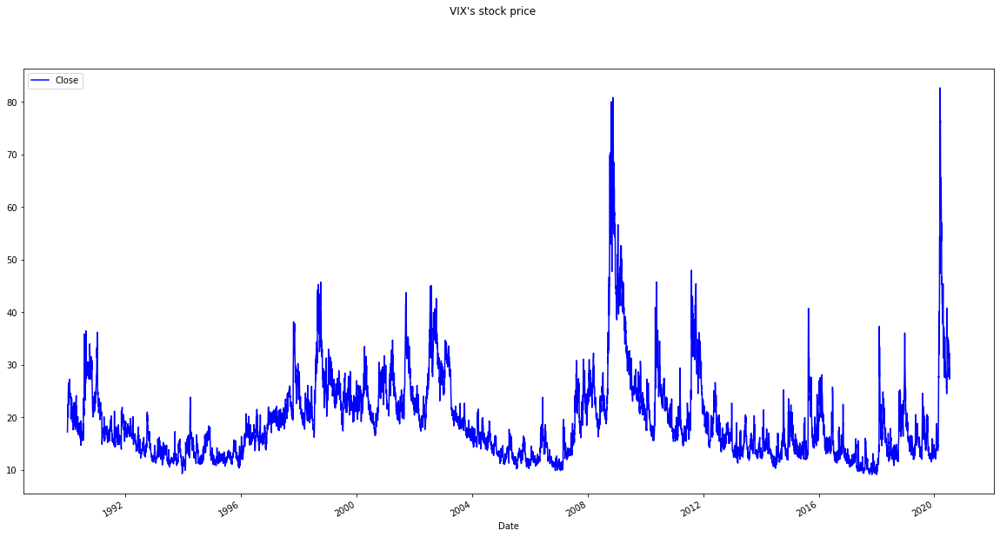

In [74]:
ticker  = yf.Ticker('^VIX')
vix_ticker = ticker.history(period="max")
vix_df.plot(x='Date', y='Close',subplots=True, color='Blue',figsize=(20,10), title="VIX's stock price");

In [37]:
#we need to create a new df with specified column for forcasting model
vix_price = vix_df[['Date','Close']]
vix_price.rename(columns = {'Date':'ds'},inplace = True)
vix_price.rename(columns = {'Close':'y'},inplace = True)
vix_price 

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds,y
0,1990-01-02,17.240000
1,1990-01-03,18.190001
2,1990-01-04,19.219999
3,1990-01-05,20.110001
4,1990-01-08,20.260000
...,...,...
7687,2020-07-07,29.430000
7688,2020-07-08,28.080000
7689,2020-07-09,29.260000
7690,2020-07-10,27.290001


In [38]:
#instantiating a new Prophet object. Any settings to the forecasting procedure are passed into the constructor. 
m = Prophet(yearly_seasonality = True, seasonality_prior_scale=0.1)
#Then we call its fit method and pass in the historical dataframe. Fitting should take 1-5 seconds.
m.fit(vix_price)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [39]:
# Forecast 365 days into future
future = m.make_future_dataframe(periods=365,freq = 'D',include_history = True) 
future.tail()

,ds
8052,2021-07-09
8053,2021-07-10
8054,2021-07-11
8055,2021-07-12
8056,2021-07-13


In [40]:
#The predict method will assign each row in future a predicted value which it names yhat. 
#If you pass in historical dates, it will provide an in-sample fit. 
#The forecast object here is a new dataframe that includes a column yhat with the forecast, as well as columns for components and uncertainty intervals.
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
8052,2021-07-09,19.611717,11.788280,27.250506
8053,2021-07-10,19.781660,12.649670,27.214106
8054,2021-07-11,19.755874,12.124225,27.597648
8055,2021-07-12,19.931218,12.680103,27.946820
8056,2021-07-13,19.714658,12.425425,28.223906


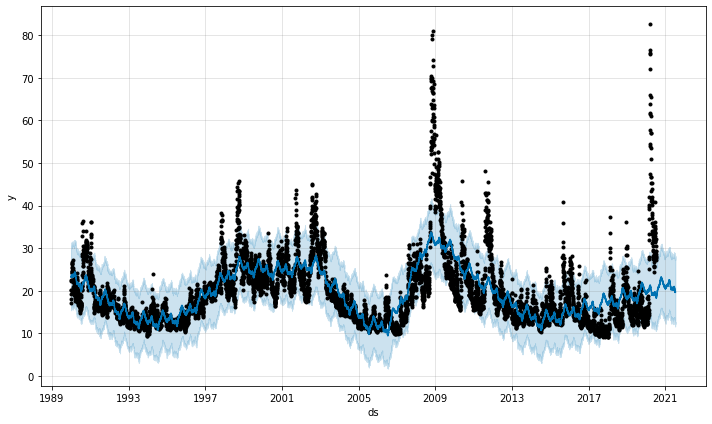

In [41]:
 # Python
fig1 = m.plot(forecast)

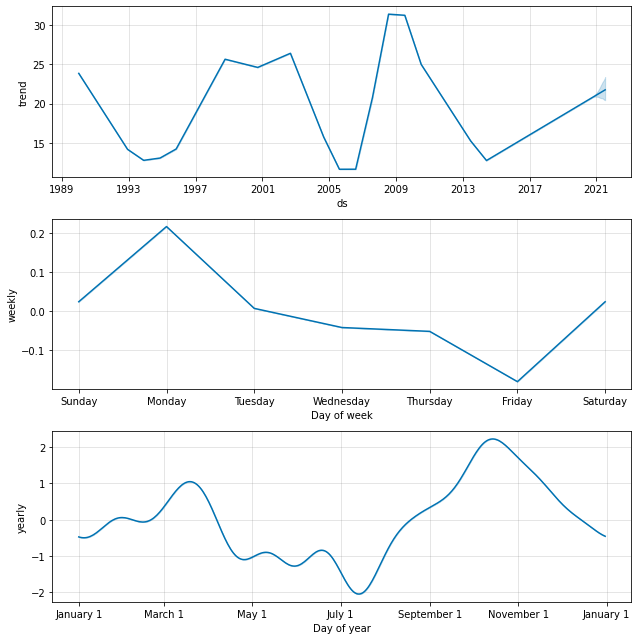

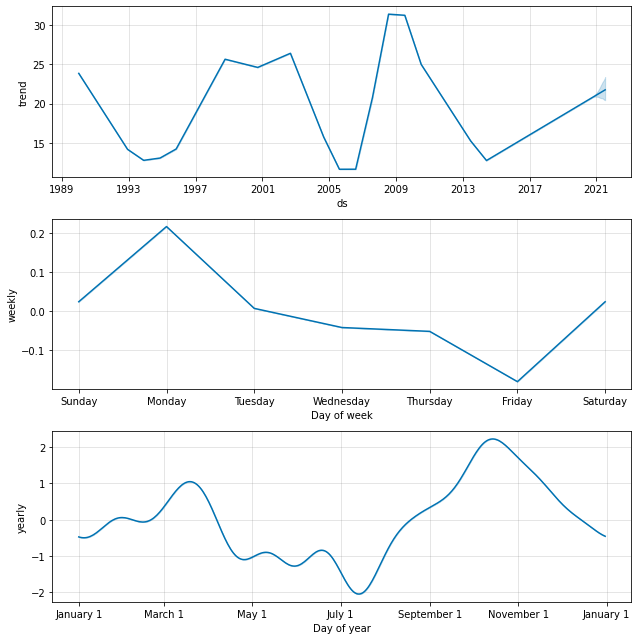

In [42]:
#trend for volatility
m.plot_components(forecast)

In [43]:
# Let make a ploty chart out of this forcasting model.
from fbprophet.plot import plot_plotly
import plotly.offline as py

In [44]:
#import plotly.offline as pyo
#import plotly.graph_objs as go
#from plotly.offline import iplot

#import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 


#cf.go_offline()

In [45]:
init_notebook_mode(connected=True)

In [46]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [47]:
configure_plotly_browser_state()
py.init_notebook_mode()
fig = plot_plotly(m, forecast)  # This returns a plotly Figure
py.iplot(fig)
plt.show;

In [48]:
vix_df

,Date,Open,High,Low,Close,Adj Close,Volume
0,1990-01-02,17.240000,17.240000,17.240000,17.240000,17.240000,0
1,1990-01-03,18.190001,18.190001,18.190001,18.190001,18.190001,0
2,1990-01-04,19.219999,19.219999,19.219999,19.219999,19.219999,0
3,1990-01-05,20.110001,20.110001,20.110001,20.110001,20.110001,0
4,1990-01-08,20.260000,20.260000,20.260000,20.260000,20.260000,0
...,...,...,...,...,...,...,...
7687,2020-07-07,28.770000,29.629999,27.250000,29.430000,29.430000,0
7688,2020-07-08,28.950001,30.200001,27.240000,28.080000,28.080000,0
7689,2020-07-09,28.180000,31.480000,26.110001,29.260000,29.260000,0
7690,2020-07-10,30.860001,30.910000,27.129999,27.290001,27.290001,0


In [49]:
#let calculate the volatility of vix

# Compute the logarithmic returns using the Closing price 
vix_df['Log_Ret'] = np.log(vix_df['Close'] / vix_df['Close'].shift(1))

In [50]:
# Compute Volatility using the pandas rolling standard deviation function
vix_df['Volatility'] = vix_df['Log_Ret'].rolling(window=7).std() * np.sqrt(1)
vix_df.head(10)

,Date,Open,High,Low,Close,Adj Close,Volume,Log_Ret,Volatility
0,1990-01-02,17.240000,17.240000,17.240000,17.240000,17.240000,0,NaN,NaN
1,1990-01-03,18.190001,18.190001,18.190001,18.190001,18.190001,0,0.053640,NaN
2,1990-01-04,19.219999,19.219999,19.219999,19.219999,19.219999,0,0.055079,NaN
3,1990-01-05,20.110001,20.110001,20.110001,20.110001,20.110001,0,0.045266,NaN
4,1990-01-08,20.260000,20.260000,20.260000,20.260000,20.260000,0,0.007431,NaN
5,1990-01-09,22.200001,22.200001,22.200001,22.200001,22.200001,0,0.091444,NaN
6,1990-01-10,22.440001,22.440001,22.440001,22.440001,22.440001,0,0.010753,NaN
7,1990-01-11,20.049999,20.049999,20.049999,20.049999,20.049999,0,-0.112616,0.065724
8,1990-01-12,24.639999,24.639999,24.639999,24.639999,24.639999,0,0.206142,0.096293
9,1990-01-15,26.340000,26.340000,26.340000,26.340000,26.340000,0,0.066718,0.096629


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f7d97a87518>],
      dtype=object)

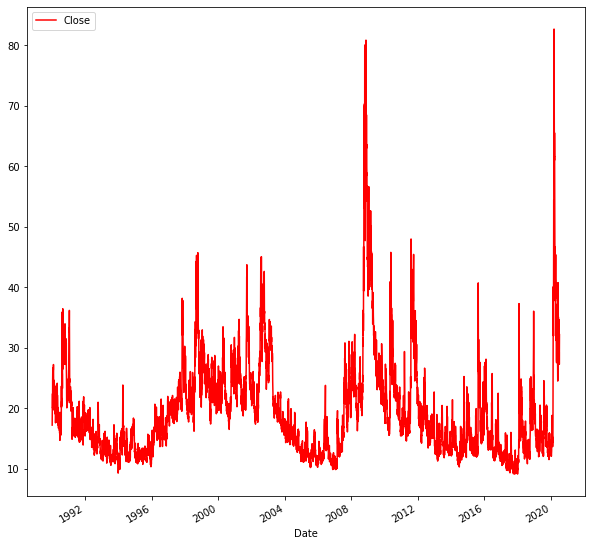

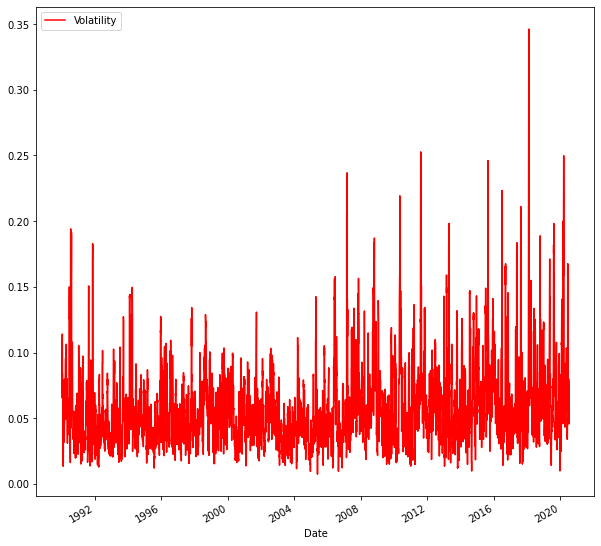

In [64]:
# Plot the crack price"Spread" and the Volatility of the Crack Price

vix_df.plot(x='Date', y='Close',subplots=True, color='red',figsize=(10,10))


vix_df.plot(x='Date', y='Volatility',subplots=True, color='red',figsize=(10,10))

In [52]:
we needto create a new df with specified column for forcasting model
vix_vio = vix_df[['Date','Volatility']]
vix_vio.rename(columns = {'Date':'ds'},inplace = True)
vix_vio.rename(columns = {'Volatility':'y'},inplace = True)
vix_vio

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds,y
0,1990-01-02,NaN
1,1990-01-03,NaN
2,1990-01-04,NaN
3,1990-01-05,NaN
4,1990-01-08,NaN
...,...,...
7687,2020-07-07,0.060390
7688,2020-07-08,0.046864
7689,2020-07-09,0.045591
7690,2020-07-10,0.049541


In [53]:
#let use FB prophet on Volatilty on VIX

#instantiating a new Prophet object. Any settings to the forecasting procedure are passed into the constructor. 
m = Prophet(yearly_seasonality = True, seasonality_prior_scale=0.1)
#Then we call its fit method and pass in the historical dataframe. Fitting should take 1-5 seconds.
m.fit(vix_vio)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [54]:
# Forecast 365 days into future
future1 = m.make_future_dataframe(periods=365,freq = 'D',include_history = True) 
future1.tail()

,ds
8052,2021-07-09
8053,2021-07-10
8054,2021-07-11
8055,2021-07-12
8056,2021-07-13


In [55]:
#The predict method will assign each row in future a predicted value which it names yhat. 
#If you pass in historical dates, it will provide an in-sample fit. 
#The forecast object here is a new dataframe that includes a column yhat with the forecast, as well as columns for components and uncertainty intervals.
forecast1 = m.predict(future1)
forecast1[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
8052,2021-07-09,0.083376,0.043358,0.123086
8053,2021-07-10,0.082135,0.042744,0.121674
8054,2021-07-11,0.081290,0.040358,0.123376
8055,2021-07-12,0.082728,0.043430,0.122294
8056,2021-07-13,0.081083,0.042042,0.122478


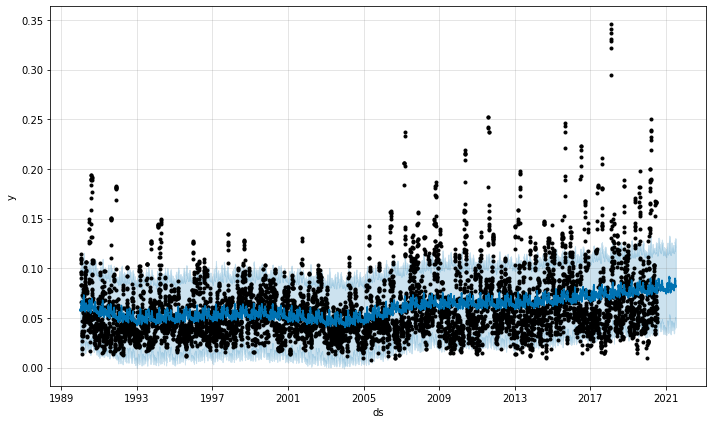

In [56]:
 # Python
fig1 = m.plot(forecast1)

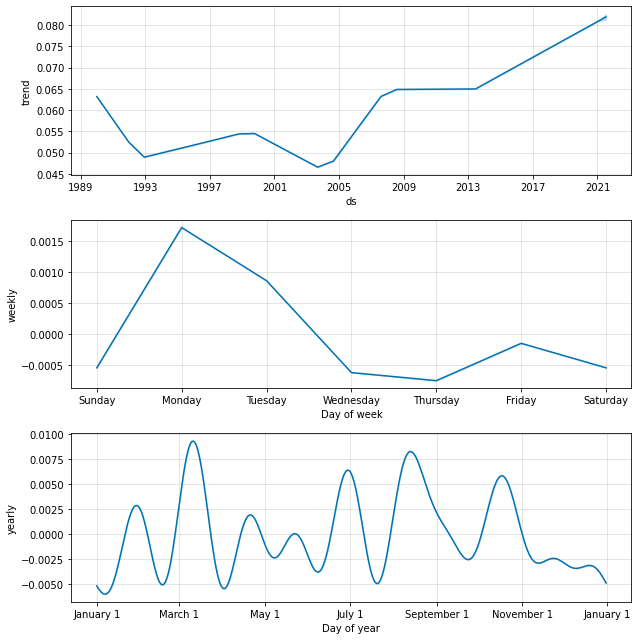

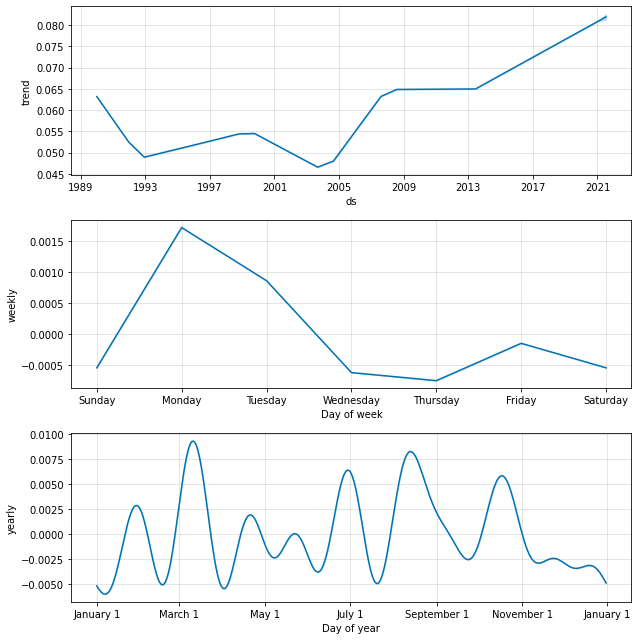

In [57]:
#trend for volatility
#plot the trend of the volatility of VIX
m.plot_components(forecast1)

In [58]:
configure_plotly_browser_state()
py.init_notebook_mode()
fig = plot_plotly(m, forecast1)  # This returns a plotly Figure
py.iplot(fig)
plt.show;